# 🧠🤖 Classificadores MLP - Identificação de animais


Classificador de 90 animais. Dataset: `iamsouravbanerjee/animal-image-dataset-90-different-animals`

In [1]:
import kagglehub
import torch
import torch.nn as nn


ds_path = kagglehub.dataset_download("iamsouravbanerjee/animal-image-dataset-90-different-animals")

ds_path

/home/Heitor-Guerra/IdeaProjects/Redes_Neurais/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


'/home/Heitor-Guerra/.cache/kagglehub/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/versions/5'

---------------------
# Hiperparâmetros

Espaço para hiperparâmetros

In [25]:
# Dataset
image_size = (128,128)
n_ins = 128*128*3
n_classes = 90

# DataLoader
batch_size = 64
shuffle = True

# Otimizador
learning_rate = 1e-3

# Treino
n_epochs = 100

# Rede
n_hidden_neurons = 256
n_hidden_layers = 3
act_fn = nn.ReLU()

---------------------
# Preparação do Dataset

Preparação do dataset usando ImageFolder do `torchvision`
Resize para 128x128

In [26]:
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
import os


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float32)
])

path = os.path.join(ds_path, "animals/animals")
classes = os.listdir(path)
classes.sort()

train_ds = ImageFolder(path, transform=transform)
train_ds.imgs

cuda


[('/home/Heitor-Guerra/.cache/kagglehub/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/versions/5/animals/animals/antelope/02f4b3be2d.jpg',
  0),
 ('/home/Heitor-Guerra/.cache/kagglehub/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/versions/5/animals/animals/antelope/03d7fc0888.jpg',
  0),
 ('/home/Heitor-Guerra/.cache/kagglehub/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/versions/5/animals/animals/antelope/058fa9a60f.jpg',
  0),
 ('/home/Heitor-Guerra/.cache/kagglehub/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/versions/5/animals/animals/antelope/0a37838e99.jpg',
  0),
 ('/home/Heitor-Guerra/.cache/kagglehub/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/versions/5/animals/animals/antelope/0b1a3af197.jpg',
  0),
 ('/home/Heitor-Guerra/.cache/kagglehub/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals/versions/5/animals/animals/antelope/0b688923b0.jpg'


---------------------
# Criação do DataLoader

Cria o DataLoader para o dataset

In [27]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=shuffle)

train_loader

Visualização de elementos

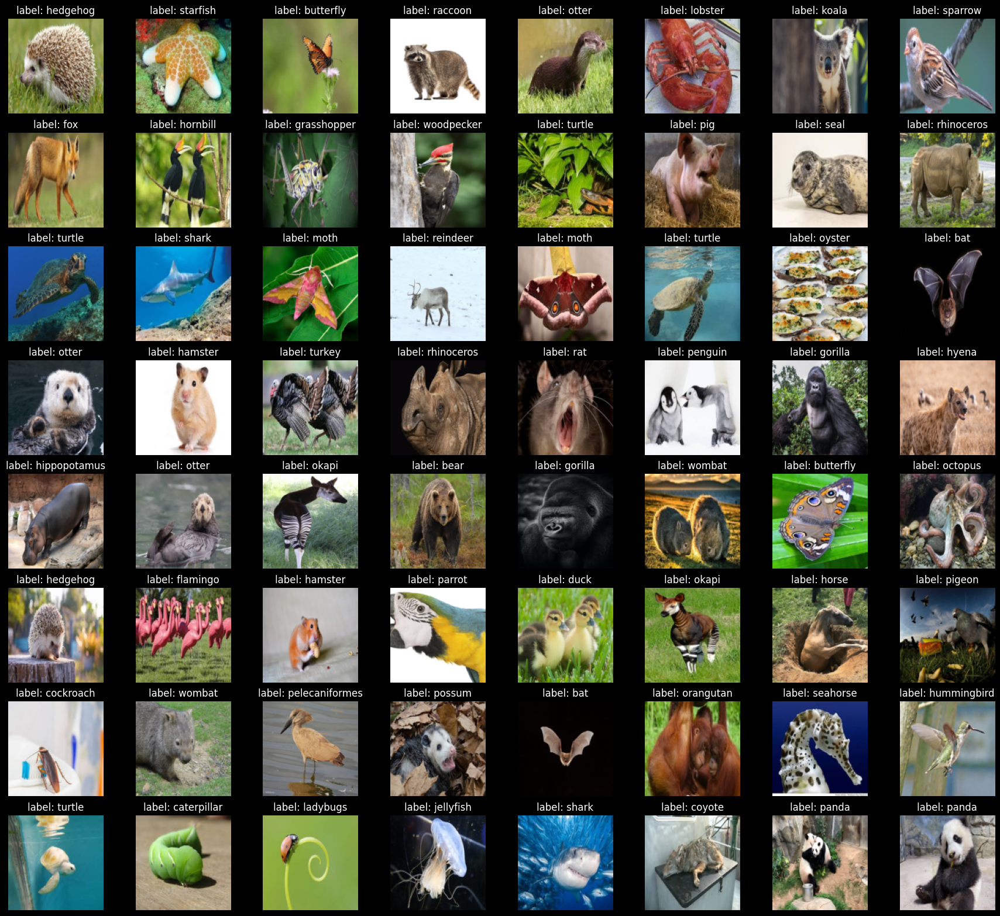

In [28]:
import matplotlib.pyplot as plt
import numpy as np

images, labels = next(iter(train_loader))
n = len(images)
grid_size = int(np.ceil(np.sqrt(n))) # square grid

plt.close('all')
plt.figure(figsize=(22, 40))
for i in range(n):
    plt.subplot(16, 8, i+1)
    plt.title(f"label: {classes[labels[i]]}")
    plt.grid(False)
    plt.axis("off")
    image = images[i].numpy()
    image = np.transpose(image, (1, 2, 0))
    plt.imshow(image)


---------------------
# Criação da Rede Neural

In [15]:
net = nn.Sequential(
    nn.Flatten(),

    nn.Linear(n_ins, n_hidden_neurons),
    act_fn,
)
for i in range(n_hidden_layers):
    net.append(nn.Linear(n_hidden_neurons, n_hidden_neurons))
    net.append(act_fn)

net.append(nn.Linear(n_hidden_neurons, n_classes))

if device.type == "cuda":
  net = nn.DataParallel(net).to("cuda")
net

DataParallel(
  (module): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=49152, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=256, bias=True)
    (4): ReLU()
    (5): Linear(in_features=256, out_features=256, bias=True)
    (6): ReLU()
    (7): Linear(in_features=256, out_features=256, bias=True)
    (8): ReLU()
    (9): Linear(in_features=256, out_features=90, bias=True)
  )
)

Definição da Loss Function e do otimizador

In [29]:
import torch.optim as optim
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), learning_rate)

Definição da Função de treinamento

In [30]:
def train(loader, net):
    true = []
    pred = []

    for batch in loader:
        data, labels = batch
        data = data.to(device)
        labels_cuda = labels.to(device)

        optimizer.zero_grad()

        outputs = net(data)

        loss = criterion(outputs, labels_cuda)
        loss.backward()

        optimizer.step()
        outputs = outputs.cpu()
        pred_y = np.argmax(outputs.detach().numpy(), axis=-1)

        pred.extend(list(pred_y))
        true.extend(labels)

    return pred, true


---------------------
# Main Function

Função para rodar o treino

In [31]:
from sklearn.metrics import accuracy_score

history = []

for i in range(n_epochs):
    preds, label = train(train_loader, net)
    accuracy = accuracy_score(label, preds)

    print(f"Epoch {i}: accuracy = {accuracy:.2f}")

    history.append(accuracy)

Epoch 0: accuracy = 0.29
Epoch 1: accuracy = 0.33
Epoch 2: accuracy = 0.35
Epoch 3: accuracy = 0.38
Epoch 4: accuracy = 0.40
Epoch 5: accuracy = 0.42
Epoch 6: accuracy = 0.44
Epoch 7: accuracy = 0.49
Epoch 8: accuracy = 0.52
Epoch 9: accuracy = 0.54
Epoch 10: accuracy = 0.54
Epoch 11: accuracy = 0.54
Epoch 12: accuracy = 0.59
Epoch 13: accuracy = 0.60
Epoch 14: accuracy = 0.64
Epoch 15: accuracy = 0.64
Epoch 16: accuracy = 0.68
Epoch 17: accuracy = 0.68
Epoch 18: accuracy = 0.71
Epoch 19: accuracy = 0.75
Epoch 20: accuracy = 0.78
Epoch 21: accuracy = 0.79
Epoch 22: accuracy = 0.76
Epoch 23: accuracy = 0.78
Epoch 24: accuracy = 0.80
Epoch 25: accuracy = 0.77
Epoch 26: accuracy = 0.81
Epoch 27: accuracy = 0.80
Epoch 28: accuracy = 0.83
Epoch 29: accuracy = 0.88
Epoch 30: accuracy = 0.84
Epoch 31: accuracy = 0.85
Epoch 32: accuracy = 0.89
Epoch 33: accuracy = 0.90
Epoch 34: accuracy = 0.89
Epoch 35: accuracy = 0.86
Epoch 36: accuracy = 0.89
Epoch 37: accuracy = 0.88
Epoch 38: accuracy = 0

KeyboardInterrupt: 

Análise Qualitativa dos resultados

/home/Heitor-Guerra/IdeaProjects/Redes_Neurais/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/Heitor-Guerra/IdeaProjects/Redes_Neurais/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/Heitor-Guerra/IdeaProjects/Redes_Neurais/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         2
           4       0.00      0.00      0.00         0
           5       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
          10       1.00      0.67      0.80         3
          11       1.00      1.00      1.00         1
          15       0.50      1.00      0.67         1
          16       1.00      1.00      1.00         1
          19       1.00      1.00      1.00         1
          23       1.00      1.00      1.00         4
          24       1.00      1.00      1.00         1
          25       0.00      0.00      0.00         1
          27       0.00      0.00      0.00         0
          28       1.00    

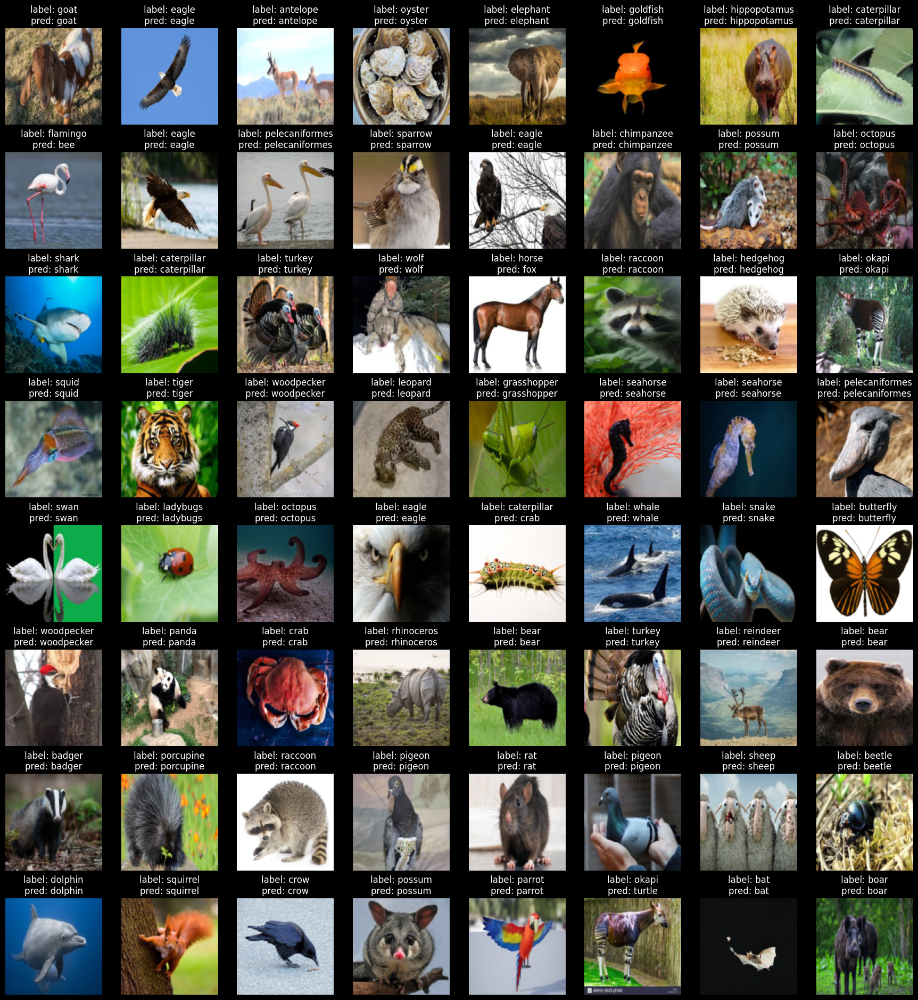

In [47]:
images, labels = next(iter(train_loader))
n = len(images)
images_cuda = images.to("cuda")

with torch.no_grad():
    preds = net(images_cuda).cpu().numpy()
preds = np.argmax(preds, axis=1)

plt.close("all")
plt.figure(figsize=(22, 48))



from sklearn.metrics import classification_report

print(classification_report(labels, preds))
for i in range(n):
    plt.subplot(16, 8, i+1)
    title = f"label: {classes[labels[i].numpy()]}\npred: {classes[preds[i]]}"
    plt.title(title)
    plt.grid(False)
    plt.axis("off")
    image = images[i].numpy()
    image = np.transpose(image, (1, 2, 0))
    plt.imshow(image)

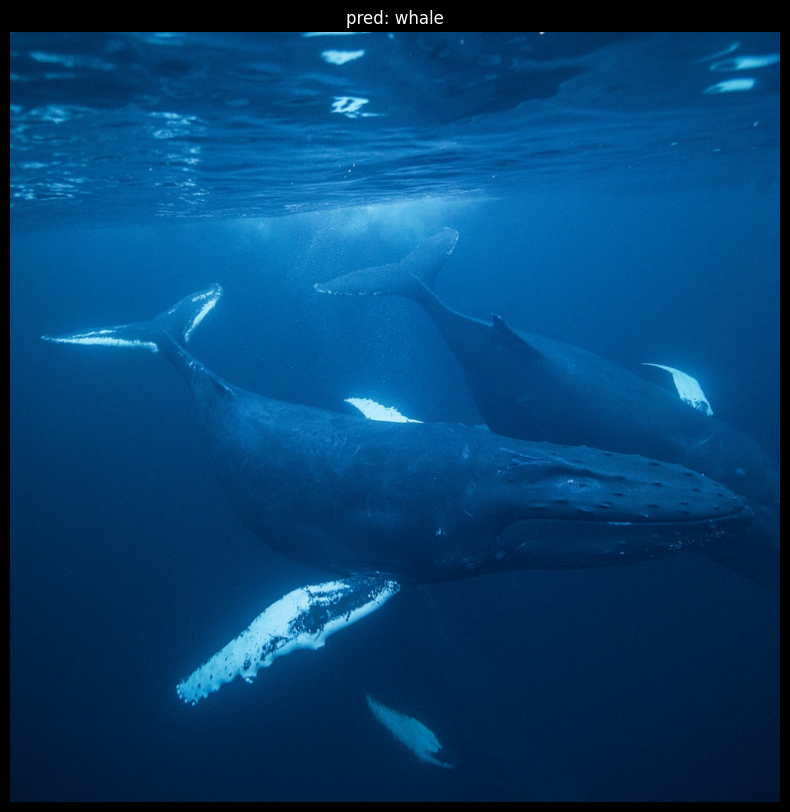

In [66]:
from PIL import Image
test_image = Image.open("test.jpg")
test_vector = transform(test_image)
test_vector = torch.tensor(np.array([test_vector]))
test_vector = test_vector.to("cuda")

with torch.no_grad():
  pred = net(test_vector).cpu().numpy()
pred = np.argmax(pred)

plt.close("all")
plt.figure(figsize=(10, 10))
plt.subplot(1, 1, 1)
plt.grid(False)
plt.axis(False)
title = f"pred: {classes[pred]}"
plt.title(title)
plt.imshow(test_image)